# Capstone Project - The Battle of the Neighborhoods
### Applied Data Science Capstone by IBM/Coursera

## Table of contents
* [Introduction: Business Problem](#introduction)
* [Data](#data)
* [Methodology](#methodology)
* [Analysis](#analysis)
* [Results and Discussion](#results)
* [Conclusion](#conclusion)



## Introduction: Business Problem <a name="introduction"></a>

The United States of America is the country with one of the largest immigrant population in the world. After the IT boom ,  this immigration in recent times has been driven by IT workers from Asia coming into  the states. A large number of them belong to India which due to its high population and educational system is able to provide one of the cheapest most talented manpower for IT firms. Indians flock by the 1000's to America chasing the American Dream. This along with the America's policy of helping the best brains of the world settle into this country has led to a large number of highly skilled immigrant population. New York has one of the largest Indian population . Out of all the Boroughs - Queens with 6.2 % Percent of Indian Americans in Municipality Population seems to be one that has welcomed the India community with open arms and  is a popular location for Indians to settle down. Indians culturally have a strong sense of family and generally prefer to be around theirs . This means they generally come to America with their spouses and Children . While to settle down the future life of their Children influences a decision to a large extent . People prefer living in neighbourhoods that have schools and parks . The presence of Doctor's Offices is also a big influencer.

In this project we will try to find an optimal location for an India family to settle. Specifically, this report will be targeted to people interested in settling down in    **Queens , New York**, USA.

Since there are lots of Neighbourhoods in Queens we will try and find a location that has :
1- Schools
2- Parks
3- Doctor's Office

We will also try and include neighbourhoods with Indian Restaurants (Although this will be an additional clincher not an influencer)

We will use our data science powers to generate a few most promising neighbourhoods based on this criteria. Advantages of each area will then be clearly expressed so that best possible final location can be chosen by stakeholders.



### IMPORTING DEPENDENCIES 

In [265]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

#!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt

# import k-means from clustering stage
from sklearn.cluster import KMeans

#!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library

print('Libraries imported.')

Libraries imported.


##  Download and Explore Dataset


New York has a total of 5 boroughs and 306 neighborhoods. In order to segement the neighborhoods and explore them, we will essentially need a dataset that contains the 5 boroughs and the neighborhoods that exist in each borough as well as the the latitude and logitude coordinates of each neighborhood. 


In [2]:
!wget -q -O 'newyork_data.json' https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-DS0701EN-SkillsNetwork/labs/newyork_data.json
print('Data downloaded!')

Data downloaded!


In [6]:
with open('newyork_data.json') as json_data:
    newyork_data = json.load(json_data)

In [7]:
neighborhoods_data = newyork_data['features']

## Tranform the data into a _pandas_ dataframe


In [8]:
# define the dataframe columns
column_names = ['Borough', 'Neighborhood', 'Latitude', 'Longitude'] 

# instantiate the dataframe
neighborhoods = pd.DataFrame(columns=column_names)

for data in neighborhoods_data:
    borough = neighborhood_name = data['properties']['borough'] 
    neighborhood_name = data['properties']['name']
        
    neighborhood_latlon = data['geometry']['coordinates']
    neighborhood_lat = neighborhood_latlon[1]
    neighborhood_lon = neighborhood_latlon[0]
    
    neighborhoods = neighborhoods.append({'Borough': borough,
                                          'Neighborhood': neighborhood_name,
                                          'Latitude': neighborhood_lat,
                                          'Longitude': neighborhood_lon}, ignore_index=True)

In [9]:
neighborhoods.head()

,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585


In [10]:
print('The dataframe has {} boroughs and {} neighborhoods.'.format(
        len(neighborhoods['Borough'].unique()),
        neighborhoods.shape[0]
    )
)

The dataframe has 5 boroughs and 306 neighborhoods.


#### Neighbourhoods in each borrough 

In [11]:
neighborhoods['Borough'].value_counts()

Queens           81
Brooklyn         70
Staten Island    63
Bronx            52
Manhattan        40
Name: Borough, dtype: int64

## Use geopy library to get the latitude and longitude values of New York City.


In [12]:
address = 'New York City, NY'

geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of New York City are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of New York City are 40.7127281, -74.0060152.


## Initialize Foursquare API 

In [13]:
LIMIT = 500 
radius = 5000 
CLIENT_ID = 'TMVQI5C2CM3B044UWBTLEH1KTHWHPAWBQ2ATC4Y4K5LO3NRS'
CLIENT_SECRET = 'SAW5JGMPMROZB1MRSOYPJUYE5GLLCHICSQGV5PNVT4UB0GSL'
VERSION = '20201209'

In [14]:
import urllib
def getNearbyVenues(names, latitudes, longitudes, radius=5000, categoryIds=''):
    try:
        venues_list=[]
        for name, lat, lng in zip(names, latitudes, longitudes):
            #print(name)

            # create the API request URL
            url = 'https://api.foursquare.com/v2/venues/search?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(CLIENT_ID, CLIENT_SECRET, VERSION, lat, lng, radius, LIMIT)

            if (categoryIds != ''):
                url = url + '&categoryId={}'
                url = url.format(categoryIds)

            # make the GET request
            response = requests.get(url).json()
            results = response["response"]['venues']

            # return only relevant information for each nearby venue
            for v in results:
                success = False
                try:
                    category = v['categories'][0]['name']
                    success = True
                except:
                    pass

                if success:
                    venues_list.append([(
                        name, 
                        lat, 
                        lng, 
                        v['name'], 
                        v['location']['lat'], 
                        v['location']['lng'],
                        v['categories'][0]['name']
                    )])

        nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
        nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude',  
                  'Venue Category']
    
    except:
        print(url)
        print(response)
        print(results)
        print(nearby_venues)

    return(nearby_venues)

## Getting the venues in Queens within a radius of 1000 m 

In [15]:
 
neighborhoods = neighborhoods[neighborhoods['Borough'] == 'Queens'].reset_index(drop=True)
Queens_venues = getNearbyVenues(names=neighborhoods['Neighborhood'], latitudes=neighborhoods['Latitude'], longitudes=neighborhoods['Longitude'], radius=1000)
Queens_venues.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Astoria,40.768509,-73.915654,Burger King,40.769464,-73.916434,Fast Food Restaurant
1,Astoria,40.768509,-73.915654,Leli's Bakery and Pastry Shop,40.765132,-73.917696,Bakery
2,Astoria,40.768509,-73.915654,A-One Laundry,40.766701,-73.916924,Laundry Service
3,Astoria,40.768509,-73.915654,NYPD - 114th Precinct,40.769508,-73.915360,Police Station
4,Astoria,40.768509,-73.915654,The Auburn Embassy (Queens Branch),40.768897,-73.915967,Sports Bar


In [16]:
Queens_venues.shape


(7956, 7)

## Visualizing a map of Queens

In [17]:
Queens_data = neighborhoods[neighborhoods['Borough'] == 'Queens'].reset_index(drop=True)
Queens_data.head()

address = 'Queens, NY'

geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Queens, NY are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Queens, NY are 40.7498243, -73.7976337.


In [20]:
# create map of Manhattan using latitude and longitude values
map_Queens = folium.Map(location=[latitude, longitude], zoom_start=11)

# add markers to map
for lat, lng, label in zip(Queens_data['Latitude'], Queens_data['Longitude'], Queens_data['Neighborhood']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_Queens)  
    
map_Queens

## Taking a look at the most common places in Queens

In [21]:
Queens_common_venues = Queens_venues.groupby('Venue Category').count().sort_values('Neighborhood',ascending=False).reset_index().rename(columns={'Neighborhood':'Count'})[['Venue Category','Count']]
Queens_common_venues.head()

,Venue Category,Count
0,Salon / Barbershop,325
1,Residential Building (Apartment / Condo),273
2,Doctor's Office,244
3,Deli / Bodega,243
4,Building,239


## Filtering to take a look at Schools in Queens 

In [23]:
Queens_schools = Queens_venues[Queens_venues['Venue Category']=='School'].reset_index(drop=True)
Queens_schools

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Jackson Heights,40.751981,-73.882821,Saint Joan Of Arc School,40.752067,-73.884623,School
1,Jackson Heights,40.751981,-73.882821,Ps 212Q,40.753397,-73.884463,School
2,Jackson Heights,40.751981,-73.882821,Children's Workshop,40.753057,-73.882103,School
3,Elmhurst,40.744049,-73.881656,P.S.7,40.743808,-73.882510,School
4,Corona,40.742382,-73.856825,P.S. 14 Q Fairview school,40.741677,-73.853932,School
5,Forest Hills,40.725264,-73.844475,PS 303Q,40.725825,-73.843885,School
6,Richmond Hill,40.697947,-73.831833,Ps 90,40.696197,-73.830170,School
7,Flushing,40.764454,-73.831773,E-Math,40.763031,-73.831048,School
8,Sunnyside,40.740176,-73.926916,P.S. 199Q (Maurice A. Fitzgerald Elementary Sc...,40.740169,-73.925599,School
9,Sunnyside,40.740176,-73.926916,P.S. 199,40.740951,-73.925761,School


In [43]:
Queens_schools['Neighborhood'].value_counts().head(10)

Neponsit             4
Belle Harbor         4
Bayside              3
Kew Gardens Hills    3
Jackson Heights      3
Fresh Meadows        3
Little Neck          3
Douglaston           3
Edgemere             3
Bellaire             3
Name: Neighborhood, dtype: int64

## Filtering to take a look at Doctor's Offices in Queens 

In [41]:
Queens_doc = Queens_venues[Queens_venues['Venue Category']=="Doctor's Office"].reset_index(drop=True)
Queens_doc

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Astoria,40.768509,-73.915654,"Chirag V. Vasa, M.D.",40.767670,-73.917000,Doctor's Office
1,Woodside,40.746349,-73.901842,Pediatric Eye MD,40.747246,-73.902658,Doctor's Office
2,Jackson Heights,40.751981,-73.882821,84th Street Medical PC,40.750180,-73.882350,Doctor's Office
3,Jackson Heights,40.751981,-73.882821,"Dr. Eduard Shnaydman, M.D.",40.751873,-73.884514,Doctor's Office
4,Jackson Heights,40.751981,-73.882821,Dr Elena King,40.750290,-73.884468,Doctor's Office
5,Jackson Heights,40.751981,-73.882821,Sleep Diagnostics Of New York Inc.,40.750172,-73.884659,Doctor's Office
6,Jackson Heights,40.751981,-73.882821,"37 Avenue Medical, P.C.",40.750038,-73.883690,Doctor's Office
7,Jackson Heights,40.751981,-73.882821,Mt Sinai,40.750000,-73.884048,Doctor's Office
8,Jackson Heights,40.751981,-73.882821,Lens Lab Express,40.749629,-73.884094,Doctor's Office
9,Jackson Heights,40.751981,-73.882821,Dr. Chhabra's Office,40.752960,-73.883636,Doctor's Office


In [46]:
Queens_doc["Neighborhood"].value_counts().head(10)

Rego Park          14
Lindenwood         13
Bay Terrace         9
Glendale            9
Holliswood          9
Jackson Heights     8
Bayside             8
Pomonok             8
Cambria Heights     8
Forest Hills        7
Name: Neighborhood, dtype: int64

## Filtering to take a look at Parks in Queens 

In [52]:
Queens_park = Queens_venues[Queens_venues['Venue Category']=="Park"].reset_index(drop=True)
Queens_park

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Elmhurst,40.744049,-73.881656,Broadway Park (Elmhurst),40.742425,-73.882481,Park
1,Corona,40.742382,-73.856825,William F. Moore Park ('Spaghetti Park'),40.743666,-73.855443,Park
2,East Elmhurst,40.764073,-73.867041,1%,40.766079,-73.866219,Park
3,Maspeth,40.725427,-73.896217,Peter Chahales Park,40.724714,-73.894511,Park
4,Glendale,40.702762,-73.870742,Forest Park - Dry Harbor Playground,40.702988,-73.867396,Park
5,Glendale,40.702762,-73.870742,Dry Harbour Park,40.702910,-73.868190,Park
6,Woodhaven,40.689887,-73.858110,51B 10-89,40.691453,-73.857525,Park
7,South Ozone Park,40.668550,-73.809865,Pals Oval Park,40.668634,-73.805878,Park
8,South Ozone Park,40.668550,-73.809865,Back Street Park,40.666542,-73.806407,Park
9,South Ozone Park,40.668550,-73.809865,Back Streets Park (Officer Edward Byrn Park),40.667846,-73.806453,Park


In [54]:
Queens_park["Neighborhood"].value_counts().head(10)

Malba                   4
Rochdale                4
Forest Hills Gardens    4
South Ozone Park        3
Broad Channel           3
Neponsit                3
Brookville              3
Laurelton               2
North Corona            2
Edgemere                2
Name: Neighborhood, dtype: int64

## Filtering to take a look at Indian Restaurants in Queens 

In [55]:
Queens_food = Queens_venues[Queens_venues['Venue Category']=="Indian Restaurant"].reset_index(drop=True)
Queens_food

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Woodside,40.746349,-73.901842,Sagarmatha Restaurant & Bar,40.745380,-73.902000,Indian Restaurant
1,Kew Gardens,40.705179,-73.829819,Tikka Indian Grill,40.705874,-73.830942,Indian Restaurant
2,Richmond Hill,40.697947,-73.831833,Tikka Curry Express,40.699478,-73.830406,Indian Restaurant
3,Long Island City,40.750217,-73.939202,Raj's Indian Kitchen,40.749976,-73.939261,Indian Restaurant
4,Ridgewood,40.708323,-73.901435,Fresh Pond Spice,40.710140,-73.899582,Indian Restaurant
5,Rego Park,40.728974,-73.857827,Sajni 026,40.728123,-73.858071,Indian Restaurant
6,Rego Park,40.728974,-73.857827,Sanji,40.728151,-73.858036,Indian Restaurant
7,Woodhaven,40.689887,-73.858110,Hyderabadi Kitchen,40.692776,-73.858742,Indian Restaurant
8,Bayside,40.766041,-73.774274,Agra Indian Cuisine,40.765396,-73.771535,Indian Restaurant
9,Bayside,40.766041,-73.774274,Ayna Agra Indian Restaurant,40.765478,-73.771737,Indian Restaurant


In [56]:
Queens_food["Neighborhood"].value_counts().head(10)

Floral Park          11
Jamaica Hills         5
Bayside               2
Rego Park             2
Long Island City      1
Woodside              1
Kew Gardens           1
North Corona          1
Sunnyside Gardens     1
Bellaire              1
Name: Neighborhood, dtype: int64

## One Hot Encoding 

In [57]:
ny_onehot = pd.get_dummies(Queens_venues[['Venue Category']], prefix="", prefix_sep="")   # Using dummies to Encode
ny_onehot['Neighborhood'] = Queens_venues['Neighborhood']

fixed_columns = [ny_onehot.columns[182]] + list(ny_onehot.columns[:182]) + list(ny_onehot.columns[183:])  # Getting the Neighborhoods column to the first
ny_onehot = ny_onehot[fixed_columns]

print(ny_onehot.shape)
ny_onehot.head()

(7956, 461)


,Frozen Yogurt Shop,ATM,Accessories Store,Acupuncturist,Advertising Agency,Afghan Restaurant,African Restaurant,Airport,Airport Gate,Airport Service,Airport Terminal,Alternative Healer,American Restaurant,Animal Shelter,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Studio,Arts & Crafts Store,Asian Restaurant,Assisted Living,Astrologer,Athletics & Sports,Auditorium,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Ballroom,Bank,Bar,Baseball Field,Basketball Court,Bathing Area,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Border Crossing,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buddhist Temple,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Center,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Campaign Office,Campground,Candy Store,Cantonese Restaurant,Capitol Building,Car Wash,Caribbean Restaurant,Carpet Store,Cemetery,Check Cashing Service,Chinese Restaurant,Chiropractor,Church,City Hall,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College & University,College Academic Building,College Administrative Building,College Auditorium,College Basketball Court,College Bookstore,College Cafeteria,College Classroom,College Communications Building,College Gym,College Lab,College Library,College Math Building,College Quad,College Rec Center,College Residence Hall,College Stadium,College Technology Building,College Theater,College Track,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Community Center,Community College,Concert Hall,Conference Room,Construction & Landscaping,Convenience Store,Convention Center,Cosmetics Shop,Courthouse,Coworking Space,Credit Union,Creperie,Cuban Restaurant,Cultural Center,Dance Studio,Daycare,Deli / Bodega,Dentist's Office,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distribution Center,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Dosa Place,Driving School,Drugstore,Dry Cleaner,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Elementary School,Embassy / Consulate,Emergency Room,Empanada Restaurant,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Fair,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Financial or Legal Service,Fire Station,Fish & Chips Shop,Fish Market,Fishing Spot,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fraternity House,French Restaurant,Fried Chicken Joint,Fruit & Vegetable Store,Funeral Home,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General College & University,General Entertainment,General Travel,German Restaurant,Gift Shop,Golf Course,Gourmet Shop,Government Building,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Herbs & Spices Store,High School,Himalayan Restaurant,Hindu Temple,Historic Site,History Museum,Hobby Shop,Hockey Field,Home Service,Hookah Bar,Hospital,Hospital Ward,Hostel,Hot Dog Joint,Hot Spring,Hotel,Hotel Bar,Hotpot Restaurant,Housing Development,Hunan Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indoor Play Area,Insurance Office,Internet Cafe,Irish Pub,Island,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kids Store,Kingdom Hall,Kitchen Supply Store,Korean Restaurant,Lake,Language School,Latin American Restaurant,Laundromat,Laundry Service,Law School,Lawyer,Library,Lingerie Store,Liquor Store,Locksmith,Lounge,Mac & Cheese Joint,Malay Restaurant,Market,Martial Arts School,Massage Studio,Mattress Store,Medical Center,Medical Lab,Medical School,Mediterranean Restaurant,Meeting Room,Memorial Site,Men's Store,Mental Health Office,

## Grouping the Categories

In [58]:
Queens_grouped = ny_onehot.groupby('Neighborhood').mean().reset_index()  # Grouping and taking the mean
print(Queens_grouped.shape)
Queens_grouped.head()

(81, 461)


,Neighborhood,Frozen Yogurt Shop,ATM,Accessories Store,Acupuncturist,Advertising Agency,Afghan Restaurant,African Restaurant,Airport,Airport Gate,Airport Service,Airport Terminal,Alternative Healer,American Restaurant,Animal Shelter,Antique Shop,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Studio,Arts & Crafts Store,Asian Restaurant,Assisted Living,Astrologer,Athletics & Sports,Auditorium,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Ballroom,Bank,Bar,Baseball Field,Basketball Court,Bathing Area,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Border Crossing,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buddhist Temple,Building,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Center,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Campaign Office,Campground,Candy Store,Cantonese Restaurant,Capitol Building,Car Wash,Caribbean Restaurant,Carpet Store,Cemetery,Check Cashing Service,Chinese Restaurant,Chiropractor,Church,City Hall,Clothing Store,Club House,Cocktail Bar,Coffee Shop,College & University,College Academic Building,College Administrative Building,College Auditorium,College Basketball Court,College Bookstore,College Cafeteria,College Classroom,College Communications Building,College Gym,College Lab,College Library,College Math Building,College Quad,College Rec Center,College Residence Hall,College Stadium,College Technology Building,College Theater,College Track,Colombian Restaurant,Comedy Club,Comfort Food Restaurant,Community Center,Community College,Concert Hall,Conference Room,Construction & Landscaping,Convenience Store,Convention Center,Cosmetics Shop,Courthouse,Coworking Space,Credit Union,Creperie,Cuban Restaurant,Cultural Center,Dance Studio,Daycare,Deli / Bodega,Dentist's Office,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distribution Center,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Dosa Place,Driving School,Drugstore,Dry Cleaner,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Elementary School,Embassy / Consulate,Emergency Room,Empanada Restaurant,Event Space,Exhibit,Eye Doctor,Fabric Shop,Factory,Fair,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Financial or Legal Service,Fire Station,Fish & Chips Shop,Fish Market,Fishing Spot,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Fraternity House,French Restaurant,Fried Chicken Joint,Fruit & Vegetable Store,Funeral Home,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General College & University,General Entertainment,General Travel,German Restaurant,Gift Shop,Golf Course,Gourmet Shop,Government Building,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Herbs & Spices Store,High School,Himalayan Restaurant,Hindu Temple,Historic Site,History Museum,Hobby Shop,Hockey Field,Home Service,Hookah Bar,Hospital,Hospital Ward,Hostel,Hot Dog Joint,Hot Spring,Hotel,Hotel Bar,Hotpot Restaurant,Housing Development,Hunan Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indoor Play Area,Insurance Office,Internet Cafe,Irish Pub,Island,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kids Store,Kingdom Hall,Kitchen Supply Store,Korean Restaurant,Lake,Language School,Latin American Restaurant,Laundromat,Laundry Service,Law School,Lawyer,Library,Lingerie Store,Liquor Store,Locksmith,Lounge,Mac & Cheese Joint,Malay Restaurant,Market,Martial Arts School,Massage Studio,Mattress Store,Medical Center,Medical Lab,Medical School,Mediterranean Restaurant,Meeting Room,Memorial Site,Men's Store,Mental H

In [96]:
grouped_scores = Queens_grouped[['Neighborhood','School',"Doctor's Office",'Park','Indian Restaurant']]  # Only Indian Restaurant needs to be considered

grouped_scores

,Neighborhood,School,Doctor's Office,Park,Indian Restaurant
0,Arverne,0.019048,0.009524,0.009524,0.000000
1,Astoria,0.000000,0.012195,0.000000,0.000000
2,Astoria Heights,0.000000,0.000000,0.000000,0.000000
3,Auburndale,0.015625,0.015625,0.000000,0.000000
4,Bay Terrace,0.010309,0.092784,0.010309,0.000000
5,Bayside,0.027027,0.072072,0.000000,0.018018
6,Bayswater,0.009804,0.009804,0.009804,0.000000
7,Beechhurst,0.019417,0.038835,0.009709,0.000000
8,Bellaire,0.028846,0.009615,0.009615,0.009615
9,Belle Harbor,0.043478,0.032609,0.010870,0.000000


## Clustering

## Using Elbow method to determine best k 

In [97]:
cost =[] 
for i in range(1, 11): 
    KM = KMeans(n_clusters = i, max_iter = 500) # Range of k-values
    KM.fit(grouped_scores.drop(columns=['Neighborhood'])) 
    cost.append(KM.inertia_)     # Getting the cost

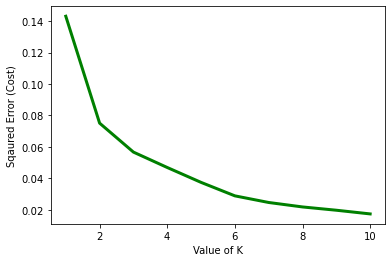

In [98]:
# plot the cost against K values 
plt.plot(range(1, 11), cost, color ='g', linewidth ='3') 
plt.xlabel("Value of K") 
plt.ylabel("Sqaured Error (Cost)") 
plt.show()

In [101]:
kclusters = 4     # No.of Clusters
ny_grouped_clustering = grouped_scores.drop('Neighborhood', 1)
# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(ny_grouped_clustering)
# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10]

array([2, 2, 2, 2, 0, 0, 2, 1, 1, 1], dtype=int32)

In [103]:
grouped = grouped_scores.copy(deep=True)
grouped['Cluster Labels'] = kmeans.labels_    # Adding the labels to the data
grouped['Cluster Labels'] = grouped['Cluster Labels'].astype(int)  # Float is sometimes returned
print(grouped.shape)
grouped.head(10)

(81, 6)


,Neighborhood,School,Doctor's Office,Park,Indian Restaurant,Cluster Labels
0,Arverne,0.019048,0.009524,0.009524,0.000000,2
1,Astoria,0.000000,0.012195,0.000000,0.000000,2
2,Astoria Heights,0.000000,0.000000,0.000000,0.000000,2
3,Auburndale,0.015625,0.015625,0.000000,0.000000,2
4,Bay Terrace,0.010309,0.092784,0.010309,0.000000,0
5,Bayside,0.027027,0.072072,0.000000,0.018018,0
6,Bayswater,0.009804,0.009804,0.009804,0.000000,2
7,Beechhurst,0.019417,0.038835,0.009709,0.000000,1
8,Bellaire,0.028846,0.009615,0.009615,0.009615,1
9,Belle Harbor,0.043478,0.032609,0.010870,0.000000,1


In [105]:
to_merged = grouped.join(Queens_venues.set_index("Neighborhood"), on="Neighborhood") # Merge with the original data
print(to_merged.shape)
to_merged.head()

(7956, 12)


,Neighborhood,School,Doctor's Office,Park,Indian Restaurant,Cluster Labels,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Arverne,0.019048,0.009524,0.009524,0.0,2,40.589144,-73.791992,Rockaway Beach - 60th Street,40.589328,-73.789144,Beach
0,Arverne,0.019048,0.009524,0.009524,0.0,2,40.589144,-73.791992,Rockaway Beach - 69th Street,40.587350,-73.797250,Surf Spot
0,Arverne,0.019048,0.009524,0.009524,0.0,2,40.589144,-73.791992,MTA Subway - Beach 67th St/Arverne By The Sea (A),40.590985,-73.796492,Metro Station
0,Arverne,0.019048,0.009524,0.009524,0.0,2,40.589144,-73.791992,Super Stop & Shop,40.590258,-73.799413,Supermarket
0,Arverne,0.019048,0.009524,0.009524,0.0,2,40.589144,-73.791992,Cuisine By Claudette,40.590558,-73.797350,Café


## Visualizing the Clusters

In [106]:
map_clusters = folium.Map(location=[latitude,longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i+x+(i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(to_merged['Neighborhood Latitude'], to_merged['Neighborhood Longitude'], to_merged['Neighborhood'], to_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' - Cluster ' + str(cluster))
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

## Analysing the Clusters Individually

In [107]:
to_merged[to_merged['Cluster Labels']==0]  # Cluster 0

,Neighborhood,School,Doctor's Office,Park,Indian Restaurant,Cluster Labels,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
4,Bay Terrace,0.010309,0.092784,0.010309,0.000000,0,40.782843,-73.776802,Q13 Bus Stop Bell Blvd & 23rd Ave,40.782715,-73.776900,Bus Stop
4,Bay Terrace,0.010309,0.092784,0.010309,0.000000,0,40.782843,-73.776802,Queens Library at Bay Terrace,40.782576,-73.776791,College Library
4,Bay Terrace,0.010309,0.092784,0.010309,0.000000,0,40.782843,-73.776802,Bay Terrace Playground,40.782517,-73.777350,Playground
4,Bay Terrace,0.010309,0.092784,0.010309,0.000000,0,40.782843,-73.776802,MTA Q13 Bus Terminal,40.782204,-73.776515,Bus Station
4,Bay Terrace,0.010309,0.092784,0.010309,0.000000,0,40.782843,-73.776802,Fort Totten Park,40.790846,-73.781745,Park
4,Bay Terrace,0.010309,0.092784,0.010309,0.000000,0,40.782843,-73.776802,"MTA NYCT Q28 MTABus QM2, QM32 (23rd Avenue & B...",40.782549,-73.776660,Bus Station
4,Bay Terrace,0.010309,0.092784,0.010309,0.000000,0,40.782843,-73.776802,Towers At Water's Edge,40.784399,-73.774649,Residential Building (Apartment / Condo)
4,Bay Terrace,0.010309,0.092784,0.010309,0.000000,0,40.782843,-73.776802,Bayside Pediatrics,40.781847,-73.775997,Doctor's Office
4,Bay Terrace,0.010309,0.092784,0.010309,0.000000,0,40.782843,-73.776802,Belshire Manor,40.782852,-73.777568,Residential Building (Apartment / Condo)
4,Bay Terrace,0.010309,0.092784,0.010309,0.000000,0,40.782843,-73.776802,Gulf Gas Station,40.781251,-73.776090,Gas Station


In [108]:
to_merged[to_merged['Cluster Labels']==1]  # Cluster 1

,Neighborhood,School,Doctor's Office,Park,Indian Restaurant,Cluster Labels,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
7,Beechhurst,0.019417,0.038835,0.009709,0.000000,1,40.792781,-73.804365,Life Health & Fitness,40.792632,-73.807440,Gym
7,Beechhurst,0.019417,0.038835,0.009709,0.000000,1,40.792781,-73.804365,Tony's Beechhurst Deli,40.791843,-73.807312,Deli / Bodega
7,Beechhurst,0.019417,0.038835,0.009709,0.000000,1,40.792781,-73.804365,Dunkin',40.792459,-73.807513,Donut Shop
7,Beechhurst,0.019417,0.038835,0.009709,0.000000,1,40.792781,-73.804365,Health Kitchen,40.792400,-73.806862,Salad Place
7,Beechhurst,0.019417,0.038835,0.009709,0.000000,1,40.792781,-73.804365,Vida Dental Spa,40.792386,-73.807738,Dentist's Office
7,Beechhurst,0.019417,0.038835,0.009709,0.000000,1,40.792781,-73.804365,North Shore Farms,40.794364,-73.807747,Supermarket
7,Beechhurst,0.019417,0.038835,0.009709,0.000000,1,40.792781,-73.804365,Beechhurst Shopping Center,40.793152,-73.807852,Shopping Mall
7,Beechhurst,0.019417,0.038835,0.009709,0.000000,1,40.792781,-73.804365,CVS pharmacy,40.745475,-74.005364,Pharmacy
7,Beechhurst,0.019417,0.038835,0.009709,0.000000,1,40.792781,-73.804365,Citibank,40.793160,-73.807437,Bank
7,Beechhurst,0.019417,0.038835,0.009709,0.000000,1,40.792781,-73.804365,New Hong Kong,40.792408,-73.806892,Chinese Restaurant


In [109]:
to_merged[to_merged['Cluster Labels']==2]  # Cluster 2

,Neighborhood,School,Doctor's Office,Park,Indian Restaurant,Cluster Labels,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Arverne,0.019048,0.009524,0.009524,0.000000,2,40.589144,-73.791992,Rockaway Beach - 60th Street,40.589328,-73.789144,Beach
0,Arverne,0.019048,0.009524,0.009524,0.000000,2,40.589144,-73.791992,Rockaway Beach - 69th Street,40.587350,-73.797250,Surf Spot
0,Arverne,0.019048,0.009524,0.009524,0.000000,2,40.589144,-73.791992,MTA Subway - Beach 67th St/Arverne By The Sea (A),40.590985,-73.796492,Metro Station
0,Arverne,0.019048,0.009524,0.009524,0.000000,2,40.589144,-73.791992,Super Stop & Shop,40.590258,-73.799413,Supermarket
0,Arverne,0.019048,0.009524,0.009524,0.000000,2,40.589144,-73.791992,Cuisine By Claudette,40.590558,-73.797350,Café
0,Arverne,0.019048,0.009524,0.009524,0.000000,2,40.589144,-73.791992,Baskin-Robbins,40.590653,-73.797223,Ice Cream Shop
0,Arverne,0.019048,0.009524,0.009524,0.000000,2,40.589144,-73.791992,Far Rockaway Beach,40.588139,-73.795659,Surf Spot
0,Arverne,0.019048,0.009524,0.009524,0.000000,2,40.589144,-73.791992,MTA Subway - Beach 60th St (A),40.592240,-73.789426,Metro Station
0,Arverne,0.019048,0.009524,0.009524,0.000000,2,40.589144,-73.791992,Joseph P Addabbo Family Health Center,40.593314,-73.792022,Doctor's Office
0,Arverne,0.019048,0.009524,0.009524,0.000000,2,40.589144,-73.791992,Breakwater Surf Co.,40.590795,-73.796416,Board Shop


In [110]:
to_merged[to_merged['Cluster Labels']==3]  # Cluster 3

,Neighborhood,School,Doctor's Office,Park,Indian Restaurant,Cluster Labels,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
26,Forest Hills,0.027027,0.189189,0.000000,0.000000,3,40.725264,-73.844475,P.S. 303 - The Academy for Excellence through ...,40.725551,-73.843725,Elementary School
26,Forest Hills,0.027027,0.189189,0.000000,0.000000,3,40.725264,-73.844475,The Bradlee,40.724677,-73.845401,Residential Building (Apartment / Condo)
26,Forest Hills,0.027027,0.189189,0.000000,0.000000,3,40.725264,-73.844475,Dr. Khosrow Alyeshmerni,40.725892,-73.844831,Office
26,Forest Hills,0.027027,0.189189,0.000000,0.000000,3,40.725264,-73.844475,PS 303Q,40.725825,-73.843885,School
26,Forest Hills,0.027027,0.189189,0.000000,0.000000,3,40.725264,-73.844475,Forest Hills Orthodontic Associates,40.723000,-73.844000,Dentist's Office
26,Forest Hills,0.027027,0.189189,0.000000,0.000000,3,40.725264,-73.844475,Dr. Griesner,40.723545,-73.844976,Dentist's Office
26,Forest Hills,0.027027,0.189189,0.000000,0.000000,3,40.725264,-73.844475,"Maisonave Business Services, Inc.",40.725371,-73.845367,Office
26,Forest Hills,0.027027,0.189189,0.000000,0.000000,3,40.725264,-73.844475,Veta Broome Aka Exit Realty,40.724452,-73.844769,Office
26,Forest Hills,0.027027,0.189189,0.000000,0.000000,3,40.725264,-73.844475,Forest Royale,40.724021,-73.844999,Residential Building (Apartment / Condo)
26,Forest Hills,0.027027,0.189189,0.000000,0.000000,3,40.725264,-73.844475,Dr Greshner,40.726182,-73.846240,Dentist's Office


## Analysing the Clusters according to our Priorities

In [151]:
t = to_merged[to_merged['Cluster Labels']==0]
print('Number of Schools in Cluster 0: \t   {}'.format(t[t['Venue Category']=='School'].count()[0]))
print('Number of Doctors Offices in Cluster 0:    {}'.format(t[t['Venue Category']=="Doctor's Office"].count()[0]))
print('Number of Parks in Cluster 0: \t\t   {}'.format(t[t['Venue Category']=='Park'].count()[0]))
print('Number of Indian Restaurants in Cluster 0: {}\n\n'.format(t[t['Venue Category']=='Indian Restaurant'].count()[0]))

t = to_merged[to_merged['Cluster Labels']==1]
print('Number of Schools in Cluster 1: \t   {}'.format(t[t['Venue Category']=='School'].count()[0]))
print('Number of Doctors Offices in Cluster 1:    {}'.format(t[t['Venue Category']=="Doctor's Office"].count()[0]))
print('Number of Parks in Cluster 1:\t\t   {}'.format(t[t['Venue Category']=='Park'].count()[0]))
print('Number of Indian Restaurants in Cluster 1: {}\n\n'.format(t[t['Venue Category']=='Indian Restaurant'].count()[0]))

t = to_merged[to_merged['Cluster Labels']==2]
print('Number of Schools in Cluster 2: \t   {}'.format(t[t['Venue Category']=='School'].count()[0]))
print('Number of Doctors Offices in Cluster 2:    {}'.format(t[t['Venue Category']=="Doctor's Office"].count()[0]))
print('Number of Parks in Cluster 2: \t\t   {}'.format(t[t['Venue Category']=='Park'].count()[0]))
print('Number of Indian Restaurants in Cluster 2: {}\n\n'.format(t[t['Venue Category']=='Indian Restaurant'].count()[0]))

t = to_merged[to_merged['Cluster Labels']==3]
print('Number of Schools in Cluster 3: \t   {}'.format(t[t['Venue Category']=='School'].count()[0]))
print('Number of Doctors Offices in Cluster 3   : {}'.format(t[t['Venue Category']=="Doctor's Office"].count()[0]))
print('Number of Parks in Cluster 3:\t\t   {}'.format(t[t['Venue Category']=='Park'].count()[0]))
print('Number of Indian Restaurants in Cluster 3: {}\n\n'.format(t[t['Venue Category']=='Indian Restaurant'].count()[0]))


Number of Schools in Cluster 0: 	   16
Number of Doctors Offices in Cluster 0:    114
Number of Parks in Cluster 0: 		   14
Number of Indian Restaurants in Cluster 0: 16


Number of Schools in Cluster 1: 	   47
Number of Doctors Offices in Cluster 1:    50
Number of Parks in Cluster 1:		   31
Number of Indian Restaurants in Cluster 1: 4


Number of Schools in Cluster 2: 	   21
Number of Doctors Offices in Cluster 2:    46
Number of Parks in Cluster 2: 		   22
Number of Indian Restaurants in Cluster 2: 11


Number of Schools in Cluster 3: 	   5
Number of Doctors Offices in Cluster 3   : 34
Number of Parks in Cluster 3:		   1
Number of Indian Restaurants in Cluster 3: 2




### It is visible from above that Cluster 1 is the most ideal as it has an excellent mix of our first 3 priorities 

## Lets Explore Cluster 1 more  

## Most Common Venues 

In [247]:
temp = to_merged[to_merged['Cluster Labels']==1]

temp.groupby('Venue Category').count().reset_index().rename(columns={'Indian Restaurant':'Count'})[['Venue Category','Count']].sort_values('Count',ascending=False).reset_index(drop=True).head(10)

,Venue Category,Count
0,Salon / Barbershop,86
1,Building,69
2,Deli / Bodega,67
3,Doctor's Office,50
4,Residential Building (Apartment / Condo),47
5,School,47
6,Bus Line,45
7,Laundry Service,45
8,Chinese Restaurant,43
9,Office,42


## Analysing the Neighborhoods in CLuster 1 as per our Priorities 

In [248]:

x = temp[temp['Venue Category'].str.contains("Indian Restaurant|Park|Doctor's Office| School")].groupby(['Neighborhood','Venue Category']).count()
x.rename(columns = {'School':'Count'}, inplace = True) 
x = pd.DataFrame(x['Count'])
x

Count
Neighborhood         Venue Category            
Beechhurst           Doctor's Office          4
                     Park                     1
Bellaire             Doctor's Office          1
                     Elementary School        1
                     High School              2
                     Indian Restaurant        1
                     Park                     1
Belle Harbor         Doctor's Office          3
                     Park                     1
Brookville           Doctor's Office          4
                     High School              2
                     Middle School            1
                     Nursery School           1
                     Park                     3
College Point        Doctor's Office          4
                     High School              1
                     Park                     1
Douglaston           Doctor's Office          4
                     Elementary School        1
                     Music School             1
Edgemere             Doctor's Office          1
                     Middle School            1
                     Music School             1
                     Nursery School           1
                     Park                     2
                     Skate Park               1
Forest Hills Gardens Doctor's Office          2
                     Elementary School        1
                     High School              1
                     Park                     4
Fresh Meadows        Music School             1
                     Nursery School           1
Jamaica Estates      High School              1
Kew Gardens Hills    Doctor's Office          4
                     Elementary School        1
                     High School              1
Laurelton            Doctor's Office          2
                     Elementary School        1
                     Nursery School           1
                     Park                     2
                     Parking                  1
Little Neck          Doctor's Office          4
                     Martial Arts School      1
                     Trade School             1
Malba                Doctor's Office          1
                     Martial Arts School      1
                     Park                     4
                     Parking                  1
                     Trade School             4
Neponsit             Doctor's Office          3
                     Park                     3
North Corona         Doctor's Office          1
                     Indian Restaurant        1
                     Park                     2
Ravenswood           Doctor's Office          3
                     High School              1
                     Indian Restaurant        1
                     Nursery School           1
                     Trade School             1
Rosedale             Doctor's Office          2
                     Elementary School        1
                     High School              1
                     Park                     1
South Ozone Park     Doctor's Office          2
                     Music School             1
                     Park                     3
                     Parking                  4
Utopia               Doctor's Office          1
                     Elementary School        3
                     Park                     2
Woodhaven            Doctor's Office          4
                     Indian Restaurant        1
                     Park                     1

### After scrolling through the neighbourhoods of Cluster 1 we can see clearly that the Neighbourhood of Brookville best suits our need 

## Brookville

In [264]:
x[9:14]

Count
Neighborhood Venue Category        
Brookville   Doctor's Office      4
             High School          2
             Middle School        1
             Nursery School       1
             Park                 3

### Brookville with options for Nursery Middle and High School along with sufficient doctors and parks is suitable for our incoming family to move into.